**Prepare workspace**

In [1]:
getwd()

[1] "/mnt/storage/r0878053/jupyternotebooks/parkinson_scRNA-seq"

**Load libraries**

In [162]:
options(stringsAsFactors=FALSE)

library(Seurat)
library(dplyr)
library(Matrix)
library(SCopeLoomR)
library(IRdisplay)
library(plyr)
library(patchwork)

ERROR: Error in library(harmony): there is no package called ‘harmony’


**Subset dataset**

In [3]:
# Load whole dataset
expression_matrix <- Read10X(
  data.dir='data/',
  unique.features = TRUE,
  strip.suffix = FALSE
)
seurat_object = CreateSeuratObject(counts = expression_matrix)

In [7]:
seurat_object_full = seurat_object
seurat_object_full

An object of class Seurat 
41625 features across 434340 samples within 1 assay 
Active assay: RNA (41625 features, 0 variable features)

In [8]:
# select 5k random cells from the dataset
set.seed(123) # Makes the random selection reproducible
numCells <- dim(seurat_object_full)[2] # Number of cells in the object
cellsSubset <- sort(sample(1:numCells, 9000))
length(cellsSubset)

[1] 9000

In [10]:
# Subset dataset: Now it contains 5k cells
seurat_object = seurat_object_full[,cellsSubset]
seurat_object

An object of class Seurat 
41625 features across 9000 samples within 1 assay 
Active assay: RNA (41625 features, 0 variable features)

In [12]:
# Export in CellRanger format 
suppressPackageStartupMessages(library(DropletUtils))
exprMat = seurat_object[['RNA']]@counts

write10xCounts(x=exprMat, path = 'CellRanger_out')

### Load the raw data (expression matrix)

In [13]:
getwd()

[1] "/mnt/storage/r0878053/jupyternotebooks/parkinson_scRNA-seq"

In [14]:
# Check the content of the path: 
dir('/mnt/storage/r0878053/jupyternotebooks/parkinson_scRNA-seq/CellRanger_out/')

[1] "barcodes.tsv" "genes.tsv"    "matrix.mtx"

In [16]:
# Read the file and format as expression matrix
expression_matrix <- Read10X(
  data.dir='/mnt/storage/r0878053/jupyternotebooks/parkinson_scRNA-seq/CellRanger_out/',
  unique.features = TRUE,
  strip.suffix = FALSE
)
dim(expression_matrix)

[1] 41625  9000

In [17]:
#inspect the top left corner of the expression matrix
expression_matrix[1:50,1:2]

50 x 2 sparse Matrix of class "dgCMatrix"
              pPDCN4340DAPIA030419_AAGTACCCATTGGCAT-1
RP11-34P13.3                                        .
FAM138A                                             .
OR4F5                                               .
RP11-34P13.7                                        .
RP11-34P13.8                                        .
RP11-34P13.14                                       .
RP11-34P13.9                                        .
FO538757.3                                          .
FO538757.2                                          3
AP006222.2                                          .
RP5-857K21.15                                       .
RP4-669L17.2                                        .
RP4-669L17.10                                       .
OR4F29                                              .
RP5-857K21.4                                        9
RP5-857K21.2                                        .
OR4F16                                  

### Create a Seurat object

In [96]:
seurat_object = CreateSeuratObject(counts = expression_matrix, min.cells = 20, min.features = 200)
seurat_object # Shows a summary of the object

An object of class Seurat 
26285 features across 9000 samples within 1 assay 
Active assay: RNA (26285 features, 0 variable features)

#### Add meta data

In [97]:
cellMetadata <- read.delim('/mnt/storage/r0878053/jupyternotebooks/parkinson_scRNA-seq/data/metadata.tsv.gz')
head(cellMetadata)

,NAME,libname,biosample_id,donor_id,species,species__ontology_label,disease,disease__ontology_label,organ,organ__ontology_label,library_preparation_protocol,library_preparation_protocol__ontology_label,sex,date,Donor_Age,Donor_PMI,Status,Cause_of_Death,FACS_Classification
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,TYPE,group,group,group,group,group,group,group,group,group,group,group,group,group,numeric,numeric,group,group,group
2,pPDCN4340DAPIA030419_AATGCCACACAAGCAG-1,pPDCN4340DAPIA030419,pPDCN4340DAPIA030419,4340,NCBITaxon_9606,Homo sapiens,PATO_0000461,normal,UBERON_0001873,caudate nucleus,EFO_0009901,10x 3' v1,male,190304,47,12.5,Ctrl,Esophageal cancer with liver mets,Negative
3,pPDCN4340DAPIA030419_AGACTCAGTCACAATC-1,pPDCN4340DAPIA030419,pPDCN4340DAPIA030419,4340,NCBITaxon_9606,Homo sapiens,PATO_0000461,normal,UBERON_0001873,caudate nucleus,EFO_0009901,10x 3' v1,male,190304,47,12.5,Ctrl,Esophageal cancer with liver mets,Negative
4,pPDCN4340DAPIA030419_ATACTTCCAGCGTTGC-1,pPDCN4340DAPIA030419,pPDCN4340DAPIA030419,4340,NCBITaxon_9606,Homo sapiens,PATO_0000461,normal,UBERON_0001873,caudate nucleus,EFO_0009901,10x 3' v1,male,190304,47,12.5,Ctrl,Esophageal cancer with liver mets,Negative
5,pPDCN4340DAPIA030419_ATATCCTGTGTGTTTG-1,pPDCN4340DAPIA030419,pPDCN4340DAPIA030419,4340,NCBITaxon_9606,Homo sapiens,PATO_0000461,normal,UBERON_0001873,caudate nucleus,EFO_0009901,10x 3' v1,male,190304,47,12.5,Ctrl,Esophageal cancer with liver mets,Negative
6,pPDCN4340DAPIA030419_ATCCACCGTGGGTTGA-1,pPDCN4340DAPIA030419,pPDCN4340DAPIA030419,4340,NCBITaxon_9606,Homo sapiens,PATO_0000461,normal,UBERON_0001873,caudate nucleus,EFO_0009901,10x 3' v1,male,190304,47,12.5,Ctrl,Esophageal cancer with liver mets,Negative


In [98]:
dim(cellMetadata)

[1] 437430     19

In [99]:
# select metadata for Homo Sapiens only
cellMetadata <- filter(cellMetadata, species__ontology_label == "Homo sapiens")

# Use cells as row names (easier subset)
rownames(cellMetadata) <- cellMetadata$NAME

# Select relevant annotations
cellMetadata <- cellMetadata[,c('biosample_id', 'donor_id', 'disease__ontology_label', 'organ__ontology_label', 'sex', 'Donor_Age', 'Status', 'Cause_of_Death', 'FACS_Classification')]

# Select cells in the seurat object
cellMetadata <- cellMetadata[Cells(seurat_object),]
dim(cellMetadata)

[1] 9000    9

In [100]:
cellMetadata

,biosample_id,donor_id,disease__ontology_label,organ__ontology_label,sex,Donor_Age,Status,Cause_of_Death,FACS_Classification
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
pPDCN4340DAPIA030419_AAGTACCCATTGGCAT-1,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative
pPDCN4340DAPIA030419_ACGGGTCCATACCATG-1,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative
pPDCN4340DAPIA030419_CAGGCCACATCGTTCC-1,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative
pPDCN4340DAPIA030419_CTCCATGTCTTAGGAC-1,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative
pPDCN4340DAPIA030419_CTGTCGTCAGAGGAAA-1,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative
pPDCN4340DAPIA030419_GCAACATGTCTTCTAT-1,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative
pPDCN4340DAPIA030419_TAAGCCAGTGCCTAAT-1,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative
pPDCN4340DAPIA030419_TACCGAATCAGTGGGA-1,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative
pPDCN4340DAPIA030419_ATCCACCGTCTGTGGC-1,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative


In [101]:
table(cellMetadata$disease__ontology_label)


Lewy body dementia             normal  Parkinson disease 
              1351               4854               2795 

In [102]:
table(cellMetadata$organ__ontology_label)


               caudate nucleus substantia nigra pars compacta 
                           979                           8021 

In [103]:
table(cellMetadata$sex)


female   male 
  5343   3657 

In [104]:
table(cellMetadata$Donor_Age)


  25   47   49   59   70   74   75   76   78   79   82   83   89   90   91   92 
 174  450  403  306  233  238  503  618  463  822 1345  750  377 1279  526  513 

In [105]:
table(cellMetadata$Status)


Ctrl  LBD   PD 
4854 1351 2795 

In [106]:
sort(table(cellMetadata$Cause_of_Death), T)


                      Parkinson's disease 
                                     3298 
                             Colon cancer 
                                     1660 
                       Lewy body dementia 
                                      848 
                          Prostate cancer 
                                      807 
                  Coronary artery disease 
                                      528 
                 Congestive Heart failure 
                                      526 
        Esophageal cancer with liver mets 
                                      450 
         Colon cancer, cholangiocarcinoma 
                                      306 
                               Not listed 
                                      265 
Seizure disorder,congenital heart disease 
                                      174 
                         Smoke inhalation 
                                      138 

In [107]:
table(cellMetadata$FACS_Classification)


Negative     NeuN Positive 
    5779      134     3087 

In [108]:
seurat_object <- AddMetaData(seurat_object, metadata = cellMetadata)

In [109]:
head(seurat_object[[]])

,orig.ident,nCount_RNA,nFeature_RNA,biosample_id,donor_id,disease__ontology_label,organ__ontology_label,sex,Donor_Age,Status,Cause_of_Death,FACS_Classification
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
pPDCN4340DAPIA030419_AAGTACCCATTGGCAT-1,pPDCN4340DAPIA030419,35740,7957,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative
pPDCN4340DAPIA030419_ACGGGTCCATACCATG-1,pPDCN4340DAPIA030419,30620,7402,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative
pPDCN4340DAPIA030419_CAGGCCACATCGTTCC-1,pPDCN4340DAPIA030419,26677,6684,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative
pPDCN4340DAPIA030419_CTCCATGTCTTAGGAC-1,pPDCN4340DAPIA030419,32468,7337,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative
pPDCN4340DAPIA030419_CTGTCGTCAGAGGAAA-1,pPDCN4340DAPIA030419,24480,6396,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative
pPDCN4340DAPIA030419_GCAACATGTCTTCTAT-1,pPDCN4340DAPIA030419,6629,3118,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative


In [110]:
all(seurat_object[['orig.ident']] == seurat_object[['biosample_id']])

[1] TRUE

In [126]:
# Number of cells by batch:
cbind(sort(table(seurat_object[['orig.ident']])))

pPDsHSrSNxi2142d200429PosA,1
pPDsHSrSNxi2561d200429PosA,1
pPDsHSrSNxi3298d200429PosB,1
pPDsHSrSNxi1963d200429PosC,2
pPDsHSrSNxi2561d200429PosC,2
pPDsHSrSNxi1963d200429PosB,4
pPDsHSrSNxi1963d200429PosD,4
pPDsHSrSNxi1963d200429PosE,4
pPDsHSrSNxi2561d200429PosB,5
pPDsHSrSNxi1963d200429PosA,6
pPDsHSrSNxi6173d200429PosB,6


In [79]:
# save a ready to use seurat object
#save(seurat_object, file='seurat_object_parkinson.RData')

### Quality control & Filtering


Warning message:
“Groups with fewer than two data points have been dropped.”


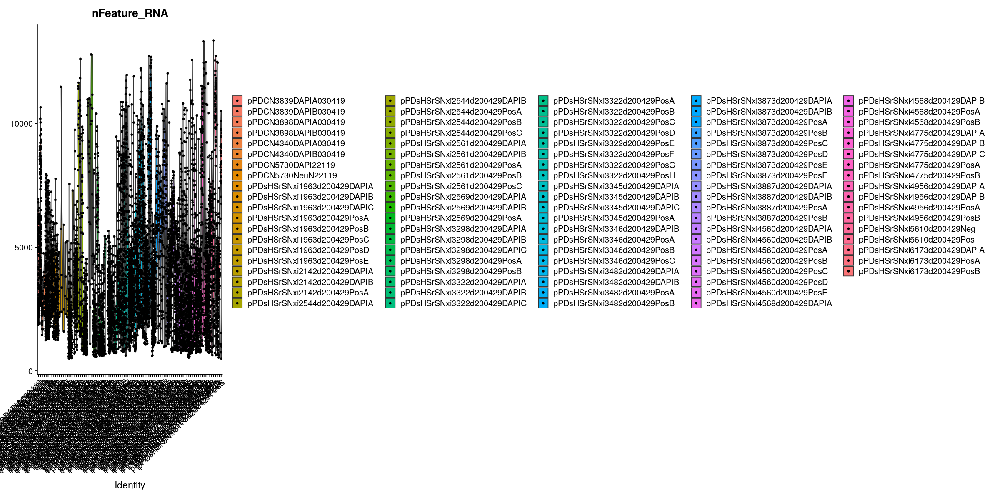

In [112]:
options(repr.plot.width=20, repr.plot.height=10) # To set the figure size
VlnPlot(object = seurat_object, features = "nFeature_RNA")

In [113]:
seurat_object[['AllData']] <- 'AllData'

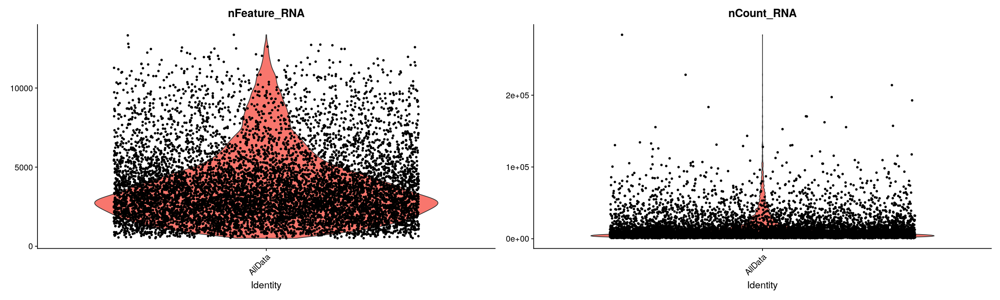

In [114]:
options(repr.plot.width=20, repr.plot.height=6) # To set the figure size
VlnPlot(object = seurat_object, features = c("nFeature_RNA", "nCount_RNA"), ncol = 2, group.by='AllData')

In [115]:
# View values
summary(seurat_object@meta.data$nFeature_RNA)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    502    2154    3254    3807    4824   13366 

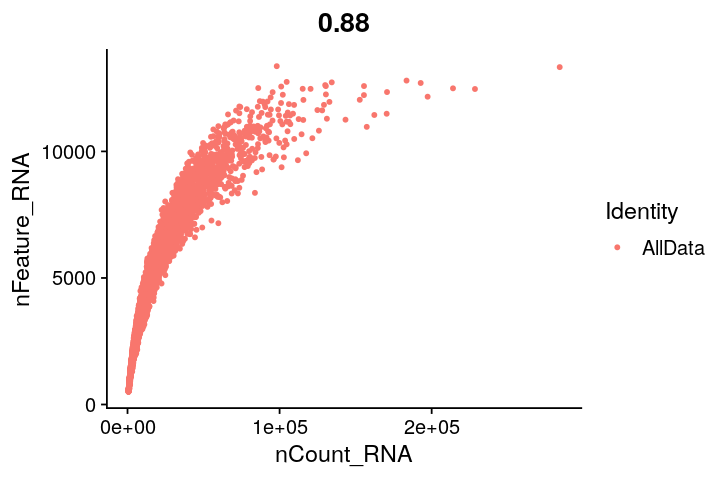

In [116]:
options(repr.plot.width=6, repr.plot.height=4)
FeatureScatter(object = seurat_object, feature1 = "nCount_RNA", feature2 = "nFeature_RNA", group.by='AllData')

In [117]:
# Check number of cells that pass the filter:
subset(seurat_object, subset = nFeature_RNA >= 1000 & nCount_RNA <= 25000)

An object of class Seurat 
26285 features across 7431 samples within 1 assay 
Active assay: RNA (26285 features, 0 variable features)

In [118]:
seurat_object

An object of class Seurat 
26285 features across 9000 samples within 1 assay 
Active assay: RNA (26285 features, 0 variable features)

In [119]:
# Perform the filtering (i.e. store the returned object)
seurat_object <- subset(seurat_object, subset = nFeature_RNA >= 1000 & nCount_RNA <= 25000)

In [120]:
seurat_object

An object of class Seurat 
26285 features across 7431 samples within 1 assay 
Active assay: RNA (26285 features, 0 variable features)

Let's see the new distributions:

Warning message:
“Groups with fewer than two data points have been dropped.”
Warning message:
“Groups with fewer than two data points have been dropped.”
Warning message:
“Groups with fewer than two data points have been dropped.”
Warning message:
“Groups with fewer than two data points have been dropped.”
Warning message:
“Groups with fewer than two data points have been dropped.”
Warning message:
“Groups with fewer than two data points have been dropped.”


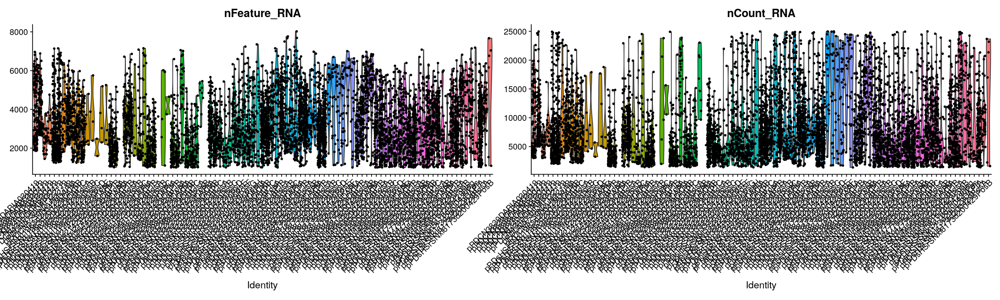

In [124]:
options(repr.plot.width=20, repr.plot.height=6)
VlnPlot(object = seurat_object, features = c("nFeature_RNA", "nCount_RNA"), ncol = 2, group.by='biosample_id')

#### Filtering based on mitochondrial genes

In [158]:
seurat_object[["percent.mt"]] <- PercentageFeatureSet(seurat_object, pattern = "^MT-")

In [159]:
summary(seurat_object[["percent.mt"]])

   percent.mt      
 Min.   : 0.04747  
 1st Qu.: 0.54228  
 Median : 1.04712  
 Mean   : 1.98892  
 3rd Qu.: 2.50463  
 Max.   :11.28063  

In [160]:
head(seurat_object[[]])

,orig.ident,nCount_RNA,nFeature_RNA,biosample_id,donor_id,disease__ontology_label,organ__ontology_label,sex,Donor_Age,Status,Cause_of_Death,FACS_Classification,AllData,percent.mt
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>
pPDCN4340DAPIA030419_CTGTCGTCAGAGGAAA-1,pPDCN4340DAPIA030419,24480,6396,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative,AllData,0.5555556
pPDCN4340DAPIA030419_GCAACATGTCTTCTAT-1,pPDCN4340DAPIA030419,6629,3118,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative,AllData,0.3318751
pPDCN4340DAPIA030419_TACCGAATCAGTGGGA-1,pPDCN4340DAPIA030419,16090,5463,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative,AllData,0.3791175
pPDCN4340DAPIA030419_ATCCACCGTCTGTGGC-1,pPDCN4340DAPIA030419,18275,6379,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative,AllData,1.0123119
pPDCN4340DAPIA030419_CCGGGTATCAGCCTCT-1,pPDCN4340DAPIA030419,22461,6749,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative,AllData,0.5654245
pPDCN4340DAPIA030419_CTCCTTTCAGCGTAGA-1,pPDCN4340DAPIA030419,17266,6027,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative,AllData,0.4807135


Warning message:
“Groups with fewer than two data points have been dropped.”
Warning message:
“Groups with fewer than two data points have been dropped.”
Warning message:
“Groups with fewer than two data points have been dropped.”


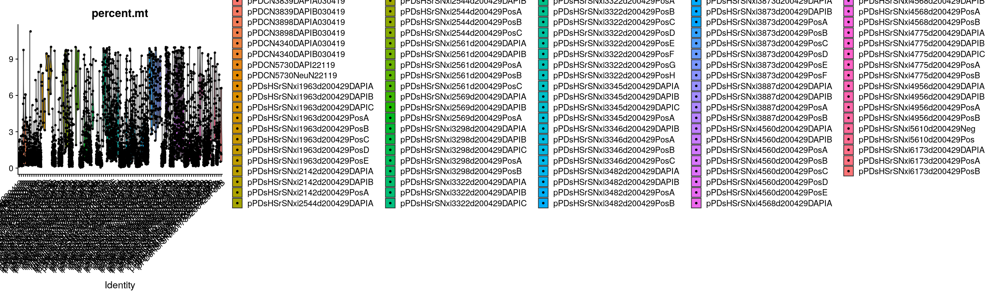

In [161]:
options(repr.plot.width=20, repr.plot.height=6)
VlnPlot(seurat_object, features = c("percent.mt"))

### Normalizing the data 


In [164]:
seurat_object <- NormalizeData(seurat_object)

In [165]:
# seurat_object[["RNA"]]@data[1:5,1:5]
GetAssayData(seurat_object, slot="data")[1:5,1:5]

5 x 5 sparse Matrix of class "dgCMatrix"
              pPDCN4340DAPIA030419_CTGTCGTCAGAGGAAA-1
RP11-34P13.7                                .        
FO538757.2                                  .        
AP006222.2                                  .        
RP4-669L17.10                               .        
RP5-857K21.4                                0.5971832
              pPDCN4340DAPIA030419_GCAACATGTCTTCTAT-1
RP11-34P13.7                                 .       
FO538757.2                                   .       
AP006222.2                                   .       
RP4-669L17.10                                .       
RP5-857K21.4                                 1.709386
              pPDCN4340DAPIA030419_TACCGAATCAGTGGGA-1
RP11-34P13.7                                 .       
FO538757.2                                   1.248760
AP006222.2                                   .       
RP4-669L17.10                                .       
RP5-857K21.4                             

In [166]:
# parkinson_seurat_obj[["RNA"]]@counts
GetAssayData(seurat_object, slot="counts")[1:5,1:5]

5 x 5 sparse Matrix of class "dgCMatrix"
              pPDCN4340DAPIA030419_CTGTCGTCAGAGGAAA-1
RP11-34P13.7                                        .
FO538757.2                                          .
AP006222.2                                          .
RP4-669L17.10                                       .
RP5-857K21.4                                        2
              pPDCN4340DAPIA030419_GCAACATGTCTTCTAT-1
RP11-34P13.7                                        .
FO538757.2                                          .
AP006222.2                                          .
RP4-669L17.10                                       .
RP5-857K21.4                                        3
              pPDCN4340DAPIA030419_TACCGAATCAGTGGGA-1
RP11-34P13.7                                        .
FO538757.2                                          4
AP006222.2                                          .
RP4-669L17.10                                       .
RP5-857K21.4                             

### Find variable genes


In [167]:
seurat_object <- FindVariableFeatures(seurat_object)

When using repel, set xnudge and ynudge to 0 for optimal results



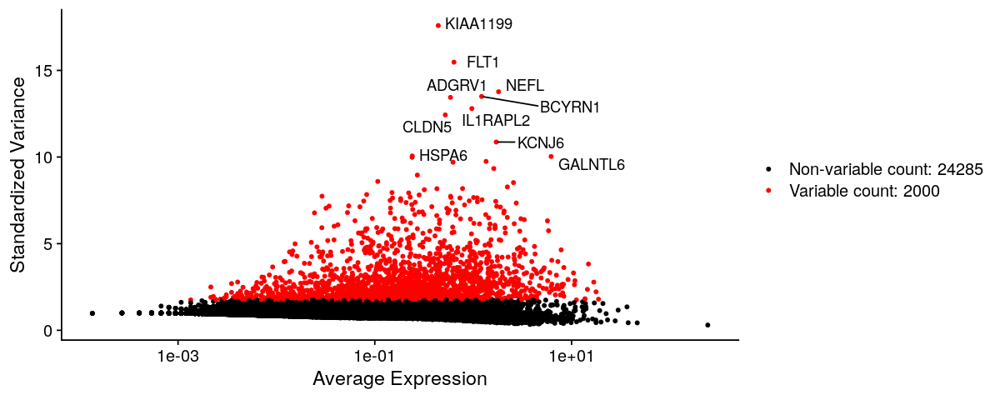

In [168]:
# plot variable features
options(repr.plot.width=10, repr.plot.height=4)
plot1 <- VariableFeaturePlot(seurat_object)
LabelPoints(plot=plot1, points=VariableFeatures(seurat_object)[1:10], repel = TRUE)

### Scaling the data


In [169]:
allGenes <- rownames(seurat_object)
seurat_object <- ScaleData(seurat_object, features = allGenes)

Centering and scaling data matrix



In [170]:
# seurat_object[["RNA"]]@scale.data[1:5,1:5]
GetAssayData(seurat_object, slot="scale.data")[1:5,1:5]

,pPDCN4340DAPIA030419_CTGTCGTCAGAGGAAA-1,pPDCN4340DAPIA030419_GCAACATGTCTTCTAT-1,pPDCN4340DAPIA030419_TACCGAATCAGTGGGA-1,pPDCN4340DAPIA030419_ATCCACCGTCTGTGGC-1,pPDCN4340DAPIA030419_CCGGGTATCAGCCTCT-1
RP11-34P13.7,-0.09701185,-0.09701185,-0.09701185,-0.09701185,3.99275112
FO538757.2,-0.20888736,-0.20888736,5.20489267,4.00236095,3.46872454
AP006222.2,-0.17018525,-0.17018525,-0.17018525,-0.17018525,4.20589112
RP4-669L17.10,-0.06132928,-0.06132928,-0.06132928,-0.06132928,-0.06132928
RP5-857K21.4,0.71902898,2.90969551,1.61564932,0.40242680,1.84978323


### Dimensionality reduction (PCA)

In [171]:
seurat_object <- RunPCA(seurat_object, ndims.print = 1:3, nfeatures.print = 5)

PC_ 1 
Positive:  RIMS2, MEG3, FGF14, MYT1L, PTPRN2 
Negative:  SPP1, CRYAB, FTL, SEPP1, PCSK6 
PC_ 2 
Positive:  CNTNAP2, ATP1B1, SPP1, NRXN3, PCSK6 
Negative:  ATP1A2, RNF219-AS1, AQP4, GJA1, RFX4 
PC_ 3 
Positive:  PCSK6, LINC00609, ERMN, CRYAB, SEPP1 
Negative:  SLCO2B1, DOCK8, MEF2C, APBB1IP, ADAM28 



In [172]:
print(seurat_object[["pca"]], dims = 1:5, nfeatures = 20)

PC_ 1 
Positive:  RIMS2, MEG3, FGF14, MYT1L, PTPRN2, ROBO2, SYT1, STXBP5L, GRIN2B, GABRB3 
	   CCSER1, FGF12, CACNA1B, KCNIP4, TENM2, MEG8, ANKRD30BL, FRMPD4, ATP8A2, DLGAP1 
Negative:  SPP1, CRYAB, FTL, SEPP1, PCSK6, SLC1A3, ERMN, SCD, LINC00609, PPP1R14A 
	   PADI2, S100B, APOD, RP11-946L20.2, B2M, CDKN1C, HSPA1A, MARCKSL1, KLK6, AC012593.1 
PC_ 2 
Positive:  CNTNAP2, ATP1B1, SPP1, NRXN3, PCSK6, ERMN, CDH8, FMN1, ROBO1, PDE1A 
	   RP11-946L20.2, IQCJ-SCHIP1, VAMP2, SCD, RP11-624C23.1, ADARB2, ERC2, SEZ6L2, RP4-630C24.3, HS3ST4 
Negative:  ATP1A2, RNF219-AS1, AQP4, GJA1, RFX4, SPARCL1, HPSE2, EFEMP1, HIF3A, BMPR1B 
	   PITPNC1, SLC14A1, MGST1, SLC1A2, RANBP3L, SLC4A4, FAM189A2, PAMR1, MRVI1, WLS 
PC_ 3 
Positive:  PCSK6, LINC00609, ERMN, CRYAB, SEPP1, SCD, RP11-946L20.2, AC012593.1, ATP1B1, S100B 
	   RP4-630C24.3, MARCKSL1, STMN4, PDE1A, ADARB2, KLK6, PPP1R14A, APOD, CDKN1C, OLIG1 
Negative:  SLCO2B1, DOCK8, MEF2C, APBB1IP, ADAM28, PTPRC, FYB, INPP5D, ARHGAP15, FLI1 
	   PALD1, DENND

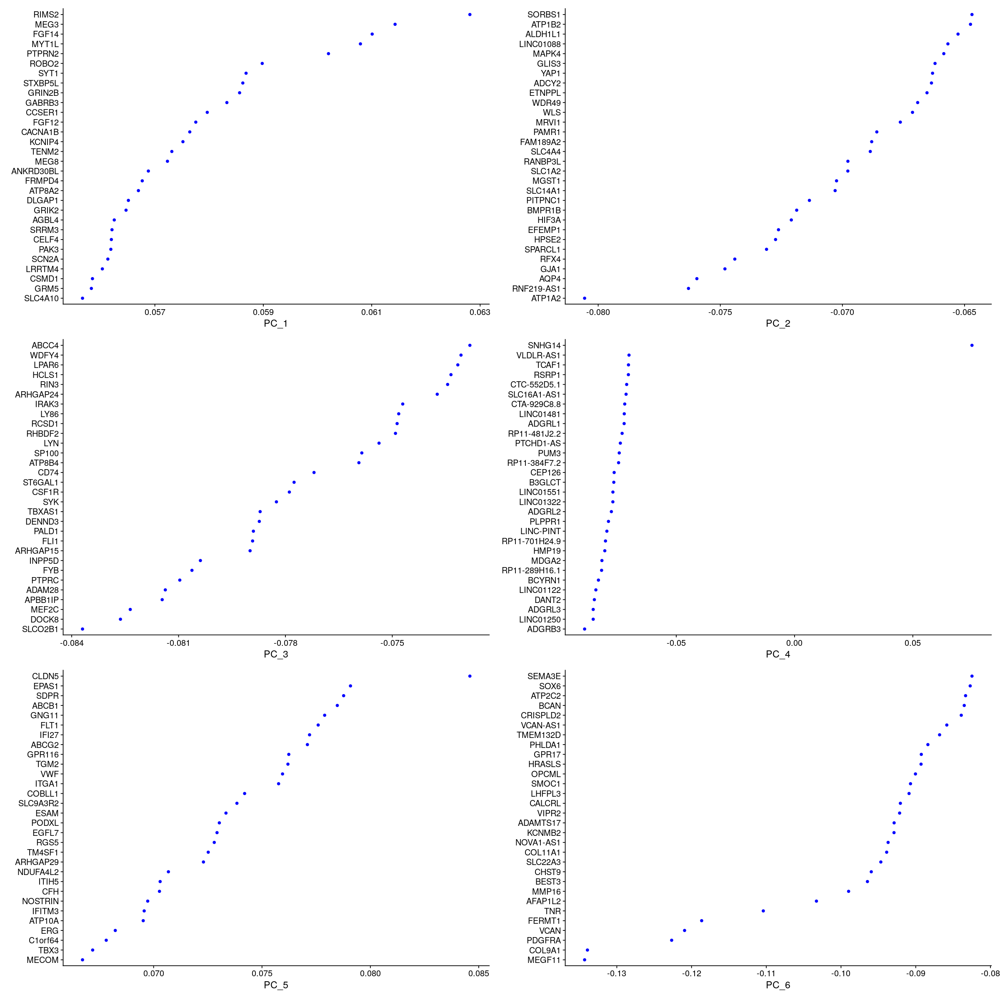

In [176]:
options(repr.plot.width=20, repr.plot.height=20)
VizDimLoadings(seurat_object, dims = 1:6, reduction = "pca")

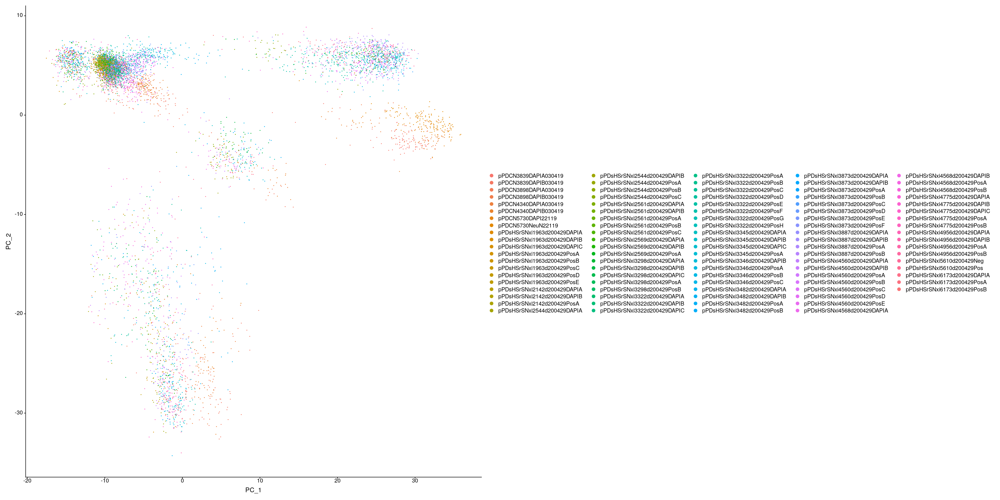

In [184]:
options(repr.plot.width=30, repr.plot.height=15)
DimPlot(seurat_object, reduction = "pca", group.by = "biosample_id")

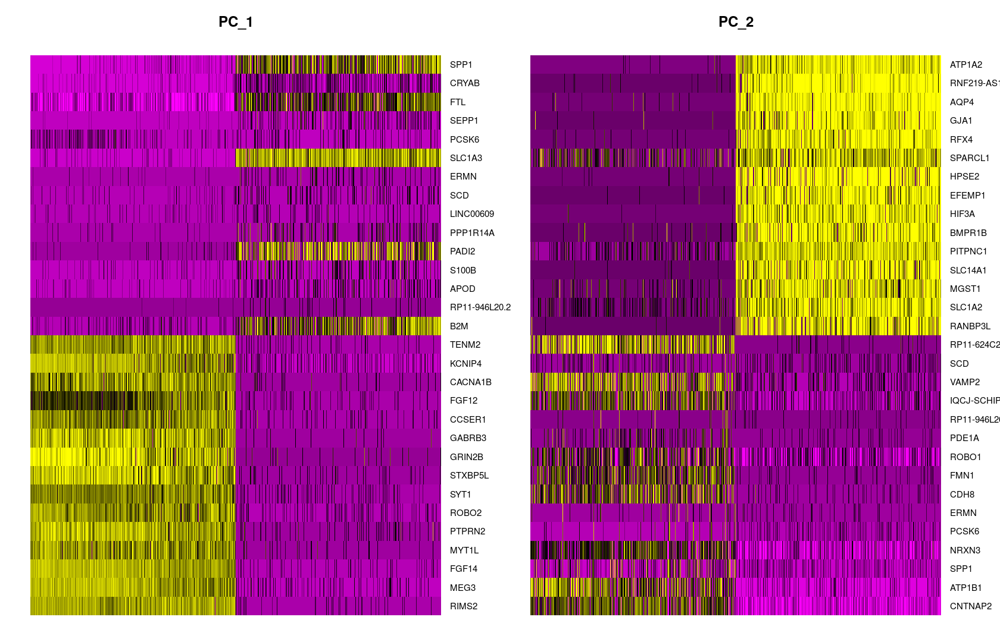

In [199]:
options(repr.plot.width=14, repr.plot.height=9)
DimHeatmap(seurat_object, dims = 1:2, cells = 800, balanced = TRUE)

### Clustering the cells

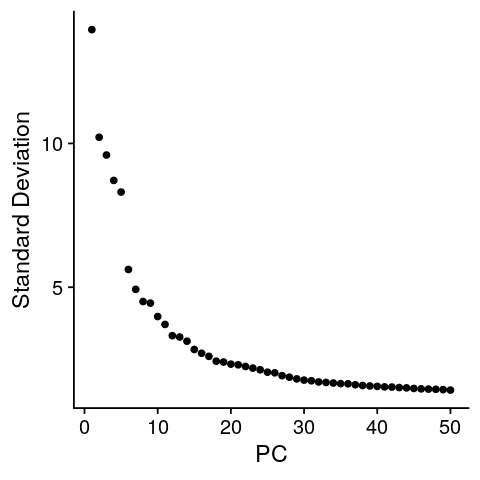

In [200]:
options(repr.plot.width=4, repr.plot.height=4)
ElbowPlot(seurat_object, ndims=50)

In [202]:
seurat_object <- FindNeighbors(seurat_object, dims = 1:20)
seurat_object <- FindClusters(seurat_object, resolution = c(0.2, 1.0, 2.0))

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 7431
Number of edges: 251900

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9619
Number of communities: 18
Elapsed time: 0 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 7431
Number of edges: 251900

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8984
Number of communities: 30
Elapsed time: 0 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 7431
Number of edges: 251900

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8533
Number of communities: 39
Elapsed time: 0 seconds


In [203]:
head(seurat_object[[]])

,orig.ident,nCount_RNA,nFeature_RNA,biosample_id,donor_id,disease__ontology_label,organ__ontology_label,sex,Donor_Age,Status,Cause_of_Death,FACS_Classification,AllData,percent.mt,RNA_snn_res.0.2,RNA_snn_res.1,RNA_snn_res.2,seurat_clusters
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<fct>,<fct>,<fct>,<fct>
pPDCN4340DAPIA030419_CTGTCGTCAGAGGAAA-1,pPDCN4340DAPIA030419,24480,6396,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative,AllData,0.5555556,5,15,23,23
pPDCN4340DAPIA030419_GCAACATGTCTTCTAT-1,pPDCN4340DAPIA030419,6629,3118,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative,AllData,0.3318751,5,15,23,23
pPDCN4340DAPIA030419_TACCGAATCAGTGGGA-1,pPDCN4340DAPIA030419,16090,5463,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative,AllData,0.3791175,5,15,23,23
pPDCN4340DAPIA030419_ATCCACCGTCTGTGGC-1,pPDCN4340DAPIA030419,18275,6379,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative,AllData,1.0123119,14,24,31,31
pPDCN4340DAPIA030419_CCGGGTATCAGCCTCT-1,pPDCN4340DAPIA030419,22461,6749,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative,AllData,0.5654245,14,24,31,31
pPDCN4340DAPIA030419_CTCCTTTCAGCGTAGA-1,pPDCN4340DAPIA030419,17266,6027,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative,AllData,0.4807135,14,24,31,31


In [204]:
# How many clusters are there in each resolution?
for (x in c('RNA_snn_res.0.2', 'RNA_snn_res.1', 'RNA_snn_res.2'))
{
    message(x, ': ', length(unique(unlist(seurat_object[[x]]))), ' custers')
}
    

RNA_snn_res.0.2: 18 custers

RNA_snn_res.1: 30 custers

RNA_snn_res.2: 39 custers



In [205]:
# How many cells are assigned by cluster?
table(Idents(seurat_object))


  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18  19 
622 558 436 419 398 387 382 348 297 258 247 244 242 213 203 199 197 178 172 150 
 20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38 
149 132 131 111  99  93  64  61  58  48  47  46  46  43  43  38  27  24  21 

### 2D projections 

In [206]:
# tSNE
seurat_object <- RunTSNE(seurat_object, dims = 1:20)
# UMAP
seurat_object <- RunUMAP(seurat_object, dims = 1:20)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
03:20:33 UMAP embedding parameters a = 0.9922 b = 1.112

03:20:33 Read 7431 rows and found 20 numeric columns

03:20:33 Using Annoy for neighbor search, n_neighbors = 30

03:20:33 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

|

03:20:34 Writing NN index file to temp file /tmp/RtmpLQj6jZ/file12f48631a63517

03:20:34 Searching Annoy index using 1 thread, search_k = 3000

03:20:37 Annoy recall = 100%

03:20:38 Commencing smooth kNN distance calibration using 1 thread

03:20:40 Found 2 conne

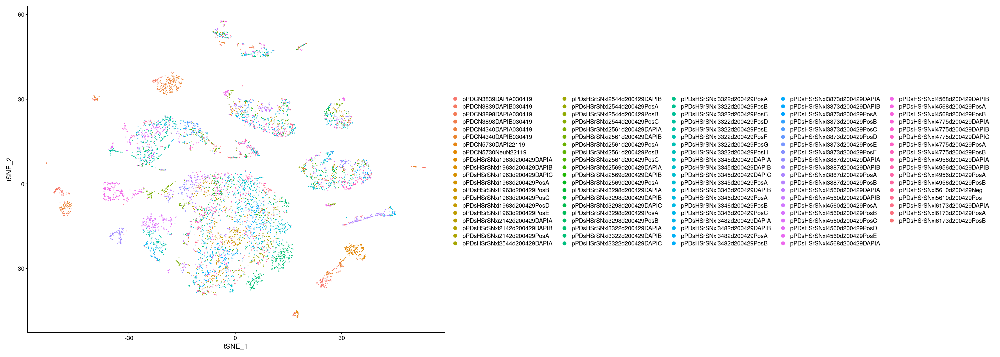

In [213]:
options(repr.plot.width=28, repr.plot.height=10)
plot1 <- DimPlot(seurat_object, reduction = "tsne", group.by = "biosample_id")
plot1

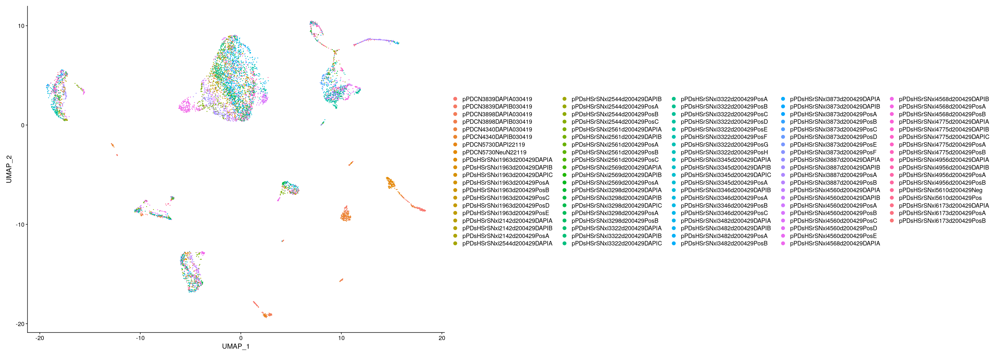

In [214]:
options(repr.plot.width=28, repr.plot.height=10)
plot2 <- DimPlot(seurat_object, reduction = "umap", group.by = "biosample_id")
plot2

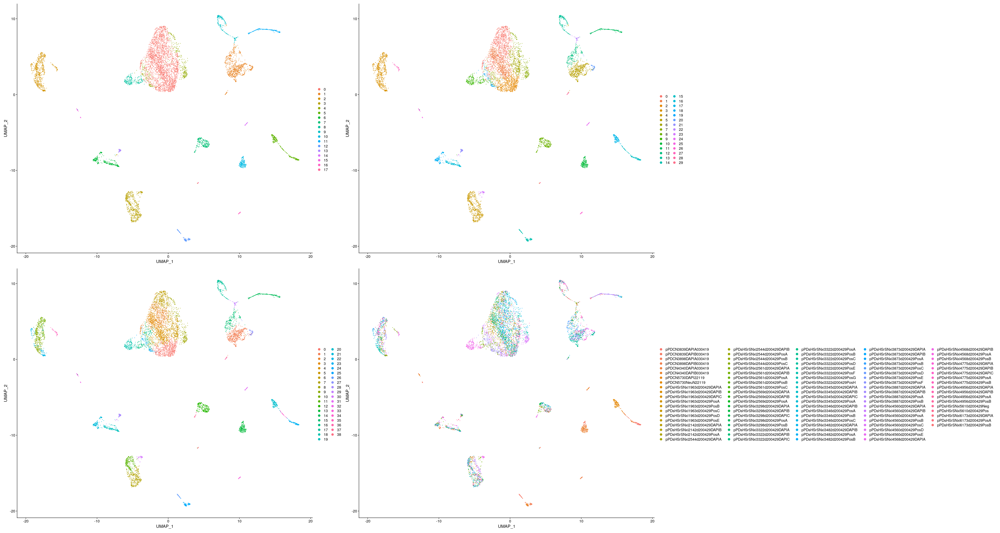

In [220]:
options(repr.plot.width=45, repr.plot.height=24)
plot1 <- DimPlot(seurat_object, reduction = "umap", group.by = 'RNA_snn_res.0.2')
plot2 <- DimPlot(seurat_object, reduction = "umap", group.by = 'RNA_snn_res.1')
plot3 <- DimPlot(seurat_object, reduction = "umap", group.by = 'RNA_snn_res.2')
plot4 <- DimPlot(seurat_object, reduction = "umap", group.by = "biosample_id")
plot1 + plot2 + plot3 + plot4

In [221]:
Idents(seurat_object) <- 'RNA_snn_res.1'
table(Idents(seurat_object))


  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18  19 
933 801 642 636 592 563 386 294 266 254 213 203 197 176 163 154 150 149 132  93 
 20  21  22  23  24  25  26  27  28  29 
 60  58  48  47  46  46  43  38  27  21 

In [222]:
cntByPatient = table(Idents(seurat_object), seurat_object$biosample_id)
cntByPatient = t(round(cntByPatient/rowSums(cntByPatient), 2))
cbind(sort(apply(cntByPatient, 2, max)))

3,0.05
4,0.06
16,0.06
5,0.07
6,0.07
18,0.07
2,0.08
8,0.08
0,0.09
12,0.09
21,0.09


### Differentially expressed genes / Markers

In [223]:
# Make sure you will use the chosen resolution:
table(Idents(seurat_object))


  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18  19 
933 801 642 636 592 563 386 294 266 254 213 203 197 176 163 154 150 149 132  93 
 20  21  22  23  24  25  26  27  28  29 
 60  58  48  47  46  46  43  38  27  21 

In [224]:
DEGs <- FindAllMarkers(seurat_object, only.pos=TRUE, min.pct=0.25)

# Save the markers for later
saveRDS(DEGs, file = "DEG.rds")

# To save as text:
write.table(DEGs, file = "DEGs.txt", sep = "\t", quote = F, col.names = F)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17

Calculating cluster 18

Calculating cluster 19

Calculating cluster 20

Calculating cluster 21

Calculating cluster 22

Calculating cluster 23

Calculating cluster 24

Calculating cluster 25

Calculating cluster 26

Calculating cluster 27

Calculating cluster 28

Calculating cluster 29



Top markers for each cluster:

In [225]:
DEGs_top5 <- DEGs %>% group_by(cluster) %>% top_n(5, avg_logFC)
DEGs_top5[1:20,]

p_val,avg_logFC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0.000000e+00,1.5226163,0.992,0.468,0.000000e+00,0,SEPP1
0.000000e+00,1.4204694,0.949,0.459,0.000000e+00,0,S100B
0.000000e+00,1.3136889,1.000,0.662,0.000000e+00,0,PLP1
0.000000e+00,1.2653776,0.999,0.622,0.000000e+00,0,CRYAB
0.000000e+00,1.2564284,0.968,0.457,0.000000e+00,0,STMN1
0.000000e+00,1.2303395,0.735,0.131,0.000000e+00,1,OPALIN
0.000000e+00,1.1827971,0.871,0.248,0.000000e+00,1,RP11-946L20.2
2.506467e-279,1.1943403,1.000,0.669,6.588248e-275,1,PLP1
7.065203e-275,1.1401785,0.955,0.465,1.857089e-270,1,CNP


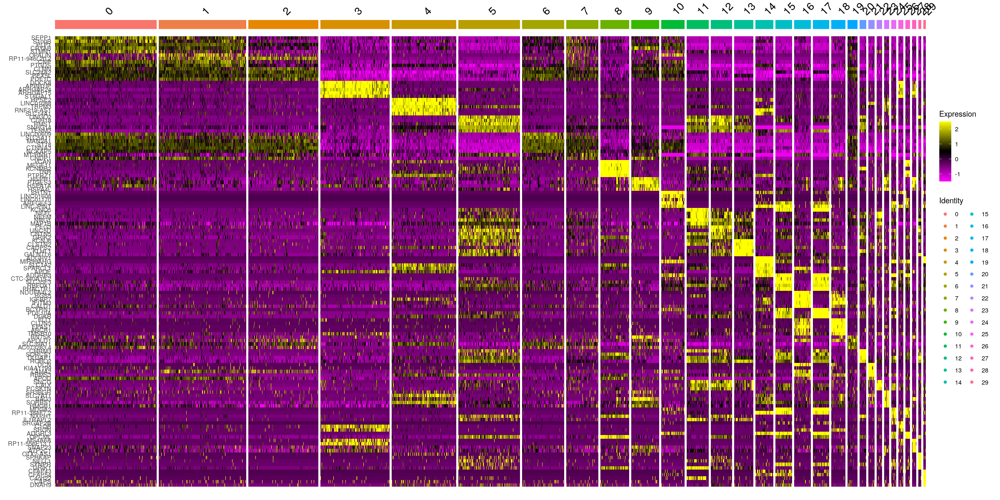

In [226]:
options(repr.plot.width=20, repr.plot.height=10)
DoHeatmap(seurat_object, features = DEGs_top5$gene)

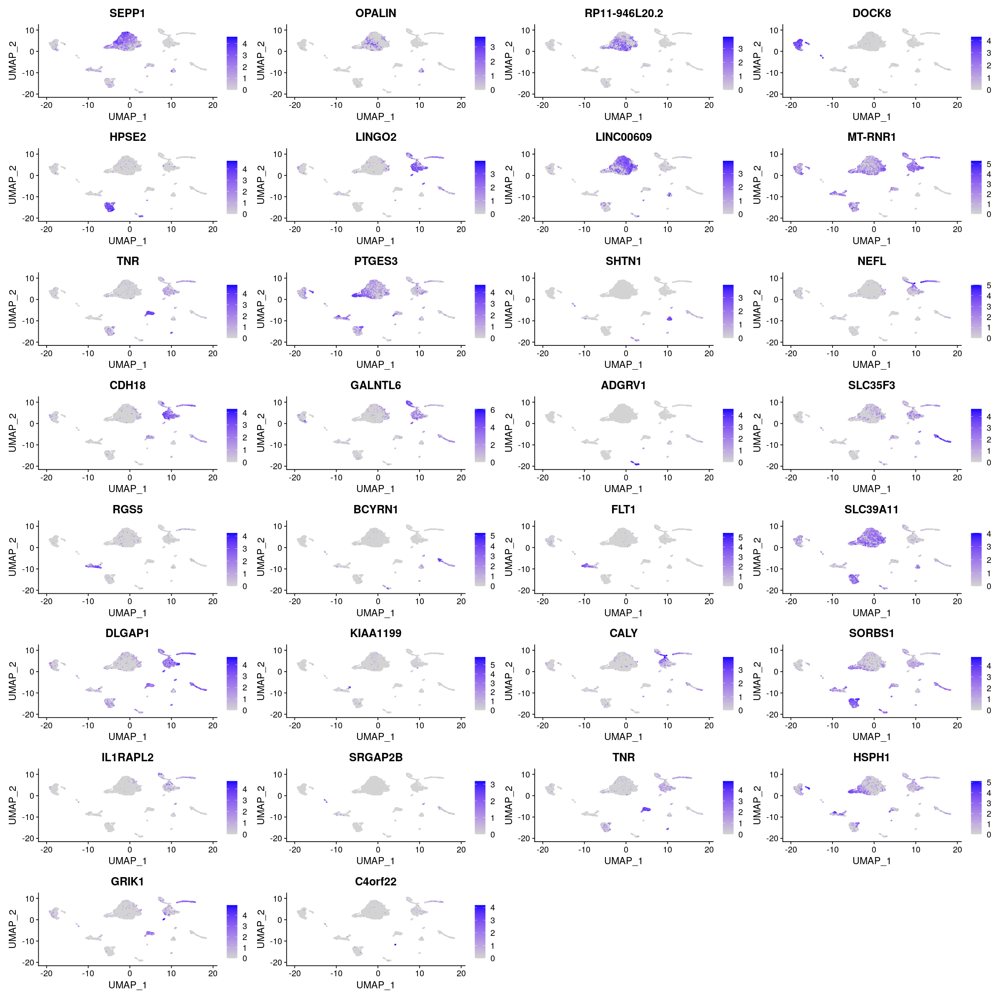

In [227]:
options(repr.plot.width=20, repr.plot.height=20)
top1 <- DEGs %>% group_by(cluster) %>% top_n(n = 1, wt = avg_logFC)
FeaturePlot(seurat_object, features = top1$gene)

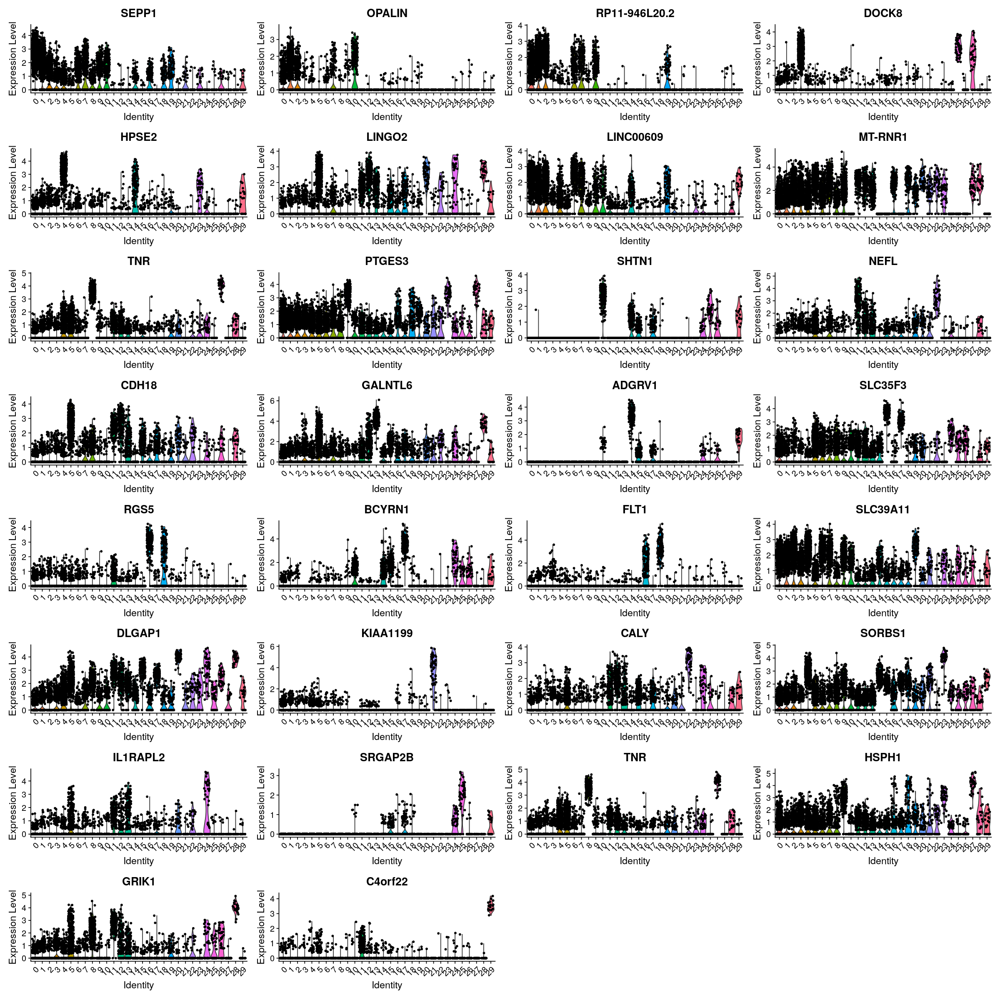

In [228]:
options(repr.plot.width=20, repr.plot.height=20)
top1 <- DEGs %>% group_by(cluster) %>% top_n(n = 1, wt = avg_logFC)
VlnPlot(seurat_object, features = top1$gene)

Picking joint bandwidth of 0.138



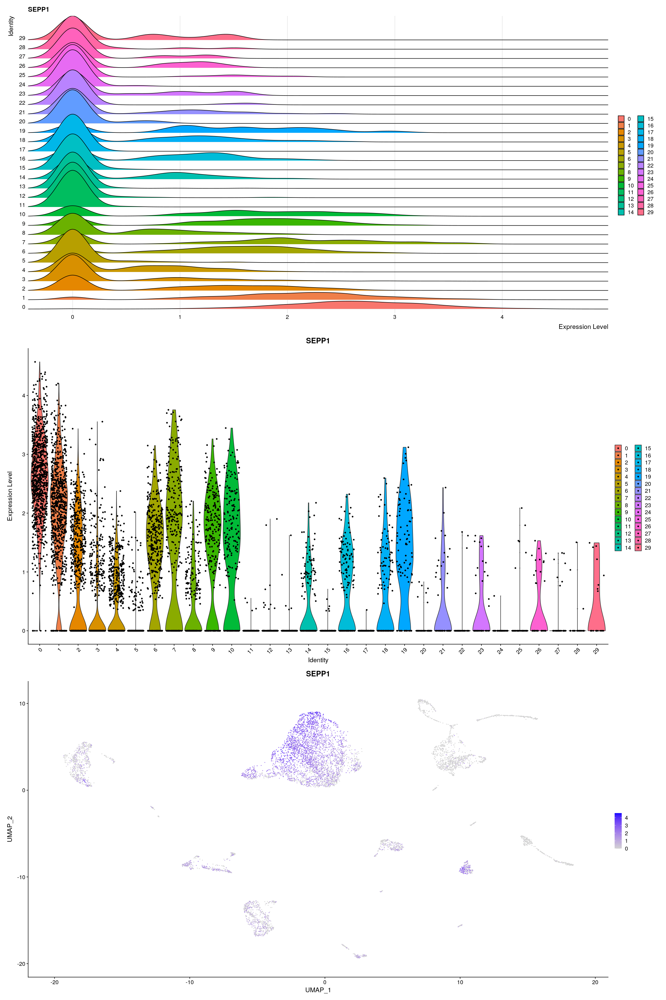

In [232]:
options(repr.plot.width=20, repr.plot.height=30)
plot1 <- RidgePlot(seurat_object, features = c("SEPP1"))
plot2 <- VlnPlot(seurat_object, features = c("SEPP1"))
plot3 <- FeaturePlot(seurat_object, features = c("SEPP1"))
plot1 + plot2 + plot3

### Save your R object


In [233]:
save(file = "seurat_object_parkinson_all_samples.RData", seurat_object)

### Cell type annotation


#### Scoring marker signatures with AUCell


###### Marker gene list

In [235]:
markersTable <- data.table::fread('/mnt/storage/r0878053/jupyternotebooks/parkinson_scRNA-seq/marker_gene_list//PanglaoDB_markers_27_Mar_2020.tsv.gz')
colnames(markersTable) <- gsub(' ', '_', colnames(markersTable))
head(markersTable)

species,official_gene_symbol,cell_type,nicknames,ubiquitousness_index,product_description,gene_type,canonical_marker,germ_layer,organ,sensitivity_human,sensitivity_mouse,specificity_human,specificity_mouse
<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
Mm Hs,CTRB1,Acinar cells,CTRB,0.017,chymotrypsinogen B1,protein-coding gene,1,Endoderm,Pancreas,1.000000,0.957143,0.000628931,0.015920100
Mm Hs,KLK1,Acinar cells,Klk6,0.013,kallikrein 1,protein-coding gene,1,Endoderm,Pancreas,0.833333,0.314286,0.005031450,0.012826300
Mm Hs,RBPJL,Acinar cells,RBP-L|SUHL|RBPSUHL,0.001,recombination signal binding protein for immunoglobulin kappa J region like,protein-coding gene,1,Endoderm,Pancreas,0.000000,0.000000,0.000000000,0.000000000
Mm Hs,PTF1A,Acinar cells,PTF1-p48|bHLHa29,0.001,pancreas associated transcription factor 1a,protein-coding gene,1,Endoderm,Pancreas,0.000000,0.157143,0.000628931,0.000773445
Mm,TRY4,Acinar cells,NA,0.007,trypsin 4,protein coding gene,1,Endoderm,Pancreas,NA,NA,NA,NA
Mm Hs,CELA3A,Acinar cells,ELA3|ELA3A,0.001,chymotrypsin like elastase family member 3A,protein-coding gene,1,Endoderm,Pancreas,0.833333,0.128571,0.000000000,0.000000000


Since the table contains markers from mouse and human, let's select the ones from human:

In [236]:
markersTable <- markersTable[grep("Hs", markersTable$species),]
nrow(markersTable)

[1] 7851

In [237]:
## Number of cell types per tissue: 
cbind(table(unique(markersTable[,c('cell_type', 'organ')])$organ))

Adrenal glands,1
Blood,4
Bone,5
Brain,34
Connective tissue,5
Embryo,5
Epithelium,3
Eye,3
GI tract,13
Heart,4
Immune system,25


To make the analysis more specific and avoid too many false positives and noise, let's focus on the organs/tissues that are most likely to have cell types in our dataset (since it is parkinson's disease: mostly brain tissue): 

In [245]:
markersTableSS <- markersTable
markersTableSS <- markersTableSS[markersTableSS$organ %in% c('Brain', 'Blood'),]
nrow(markersTableSS)

[1] 1757

Let's format the markers as gene-sets (the format required by AUCell, and most enrichment tools)

In [246]:
## Format as GeneSets
geneSets <- split(markersTableSS$official_gene_symbol, markersTableSS$cell_type)
geneSets <- geneSets[lengths(geneSets) >= 50] # Down to 10 it might be ok
geneSets <- setNames(geneSets, paste(names(geneSets), " (", lengths(geneSets) ,"g)", sep=""))
length(geneSets)

[1] 13

In [247]:
cbind(lengths(geneSets))

Astrocytes (63g),63
Cajal-Retzius cells (78g),78
Ependymal cells (56g),56
Erythroid-like and erythroid precursor cells (70g),70
Interneurons (217g),217
Microglia (71g),71
Neural stem/precursor cells (57g),57
Neuroblasts (50g),50
Neurons (203g),203
Oligodendrocytes (88g),88
Platelets (130g),130


##### Score with AUCell

In [248]:
library(AUCell) 
require(scales)

In [249]:
# Score gene-sets on the cells
# note: current version of aucell is faster. Use AUCell_run() instead of these two functions.
cells_rankings <- AUCell_buildRankings(seurat_object@assays$RNA[], plotStats=FALSE)
cells_AUC <- AUCell_calcAUC(geneSets, cells_rankings)

Quantiles for the number of genes detected by cell: 
(Non-detected genes are shuffled at the end of the ranking. Keep it in mind when choosing the threshold for calculating the AUC).



 min   1%   5%  10%  50% 100% 
1000 1057 1290 1536 3053 8023 


Genes in the gene sets NOT available in the dataset: 
	Astrocytes (63g): 	3 (5% of 63)
	Cajal-Retzius cells (78g): 	4 (5% of 78)
	Ependymal cells (56g): 	1 (2% of 56)
	Erythroid-like and erythroid precursor cells (70g): 	7 (10% of 70)
	Interneurons (217g): 	9 (4% of 217)
	Microglia (71g): 	3 (4% of 71)
	Neural stem/precursor cells (57g): 	7 (12% of 57)
	Neuroblasts (50g): 	8 (16% of 50)
	Neurons (203g): 	9 (4% of 203)
	Oligodendrocytes (88g): 	1 (1% of 88)
	Platelets (130g): 	17 (13% of 130)
	Purkinje neurons (59g): 	1 (2% of 59)
	Retinal ganglion cells (69g): 	2 (3% of 69)



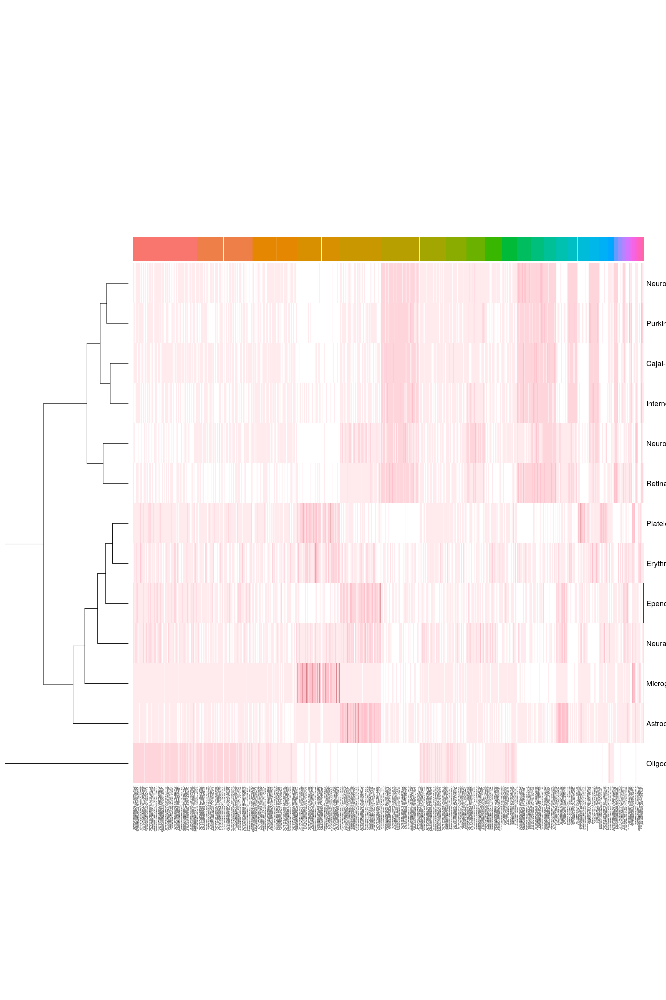

In [250]:
## Order cells by cluster & select colors
clusterOrder <- levels(seurat_object$`RNA_snn_res.1`)
sampleOrderBySubtype <- sort(match(seurat_object$`RNA_snn_res.1`, clusterOrder),index.return=TRUE)$ix
clusterColors <- setNames(hue_pal()(length(clusterOrder)), clusterOrder)

## Plot as heatmap
set.seed(123)
heatmap(getAUC(cells_AUC)[,sampleOrderBySubtype], 
        Colv=NA, scale="row", margins=c(3,5), 
        col=grDevices::colorRampPalette(c("white","pink","darkred", "red"))(10), 
        ColSideColors=rep(clusterColors, times=table(seurat_object$`RNA_snn_res.1`)[names(clusterColors)]),
        cexRow=2, main=" \n ")